In [1]:
import os
import sys

In [2]:
%matplotlib inline

from matplotlib import rc
import matplotlib.pyplot as plt 
from matplotlib.pyplot import imshow, quiver

In [3]:
import scipy
from scipy import ndimage as ndi
import networkx as nx

In [4]:
import numpy as np
from numpy.random import randn

In [5]:
from tqdm.auto import tqdm

In [6]:
import napari

In [7]:
import astromorpho as astro

Can't load imreg package, affine and homography registrations won't work


/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/imfun/external/tifffile.py:7261: UserWarning: No module named 'imfun.external._tifffile'
  Functionality might be degraded or be slow.

  warnings.warn("%s%s" % (e, warn))
/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/imfun/external/czifile.py:146: UserWarning: ImportError: No module named '_czifile'. Decoding of JXR and JPEG encoded images will not be available. Czifile.pyx can be obtained at http://www.lfd.uci.edu/~gohlke/
  warnings.warn(
2022-05-18 14:15:28.936166: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/levtg/astro-morpho/venv/lib/python3.10/site-packages/cv2/../../lib64:/home/levtg/v3d_external/v3d_main/common_lib/lib/
2022-05-18 14:15:28.936188: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dler

In [8]:
data_place = '/home/levtg/astro-morpho/data/'

# Image processing

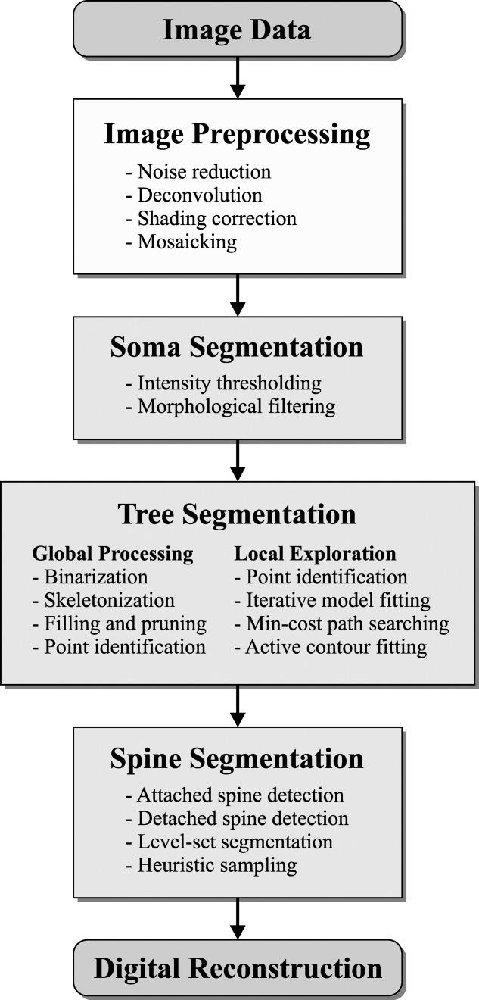

In [1]:
from IPython.display import Image
Image(filename='/home/levtg/astro-morpho/data/pictures_nb/plan.jpg') 

# Image Data

Линии

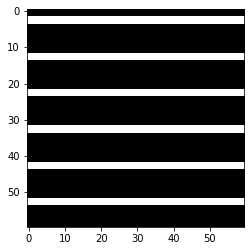

In [8]:
img_lines = np.zeros((100,100))
img_lines[2::10] = 1
img_lines[3::10] = 1
img_lines = img_lines[20:-20,20:-20]

img_lines = np.clip(img_lines, 0, 1)
crop = (slice(20,-20), slice(20,-20))
img = img_lines
imshow(img, cmap='gray')

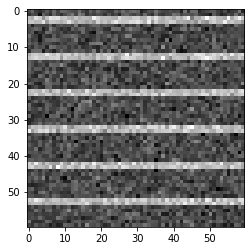

In [9]:
SNR = 5
img_noisy = SNR*img + randn(*img.shape)
imshow(img_noisy, cmap='gray')

Сетка

In [ ]:
img_lines = np.zeros((100,100))
img_lines[2::20] = 1
img_lines[3::20] = 1
img_lines[4::20] = 1

img_lines[..., 2::20] = 1
img_lines[..., 3::20] = 1
img_lines[..., 4::20] = 1

# img_lines = img_lines[20:-20,20:-20]

img_lines = np.clip(img_lines, 0, 1)
crop = (slice(20,-20), slice(20,-20))
img = img_lines[crop]
imshow(img, cmap='gray')

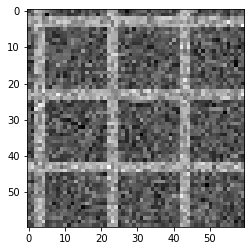

In [655]:
SNR = 3
img_noisy = SNR*img + randn(*img.shape)
imshow(img_noisy, cmap='gray')

Косая Сетка

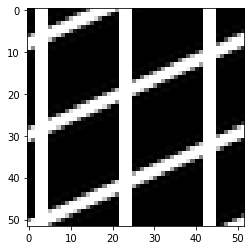

In [9]:
img_lines = np.zeros((100,100))
img_lines[2::20] = 1
img_lines[3::20] = 1
img_lines[4::20] = 1

img_lines = ndi.rotate(img_lines, 24)

img_lines[..., 2::20] = 1
img_lines[..., 3::20] = 1
img_lines[..., 4::20] = 1

img_lines = img_lines[20:-20,20:-20]

img_lines = np.clip(img_lines, 0, 1)
crop = (slice(20,-20), slice(20,-20))
img = img_lines[crop]
imshow(img, cmap='gray')

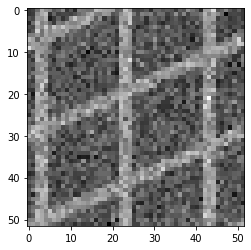

In [10]:
SNR = 3
img_noisy = SNR*img + randn(*img.shape)
imshow(img_noisy, cmap='gray')

Повернутый крест

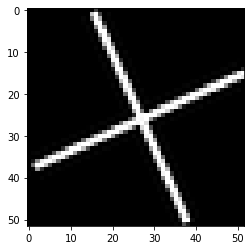

In [152]:
img_cross = np.zeros((100,100))
img_cross[50:52, 23:78] = 1
img_cross[23:78,50:52] = 1
img_cross = ndi.rotate(img_cross, 24)
img_cross = img_cross[20:-20,20:-20]

img_cross = np.clip(img_cross, 0, 1)
crop = (slice(20,-20), slice(20,-20))
img = img_cross[crop]
imshow(img, cmap='gray', interpolation='nearest')

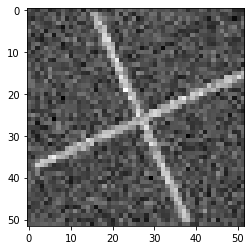

In [153]:
SNR = 5
img_noisy = SNR*img + randn(*img.shape)
imshow(img_noisy, cmap='gray',interpolation='nearest')

Астроцит (реальный)

In [9]:
import ccdb

In [10]:
def read_image(filename):
    stack, meta = ccdb.read_pic(filename)
    dims = ccdb.get_axes(meta)
    if len(dims):
        zoom = dims[0][0]/dims[-1][0]
    else:
        zoom = 4
    return ndi.zoom(stack.astype(float),(1, zoom,zoom))

In [11]:
filename = '/home/levtg/astro-morpho/data/3wk-both1-grn-raw.pic'

In [12]:
stack, meta = ccdb.read_pic(filename)
dims = ccdb.get_axes(meta)#[::-1]
dims

[(0.06491228, "Microns'"), (0.06491228, "Microns'"), (0.3, "Microns'")]

In [13]:
stack.shape

(77, 1024, 1024)

In [14]:
if len(dims):
    zoom = dims[0][0]/dims[-1][0]
else:
    zoom = 4

In [16]:
img_noisy = ndi.zoom(stack.astype(float),(1, zoom,zoom))

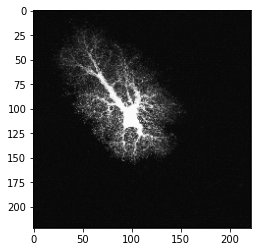

In [17]:
plt.imshow(img_noisy.max(0), cmap='gray')

# Image preprocesssing

## Фильтрация изображения

In [18]:
from skimage.filters import threshold_li
from skimage.morphology import remove_small_objects

In [19]:
def filter_image(image, filter_func, **kwargs):
    threshold = filter_func(image)
    img_filt = np.where(image > threshold, image, 0)
    binary_clean = remove_small_objects(image >= threshold, 5, connectivity=3)
    return np.where(binary_clean, img_filt, 0)

In [20]:
img_clear = filter_image(img_noisy, threshold_li)

### 2D

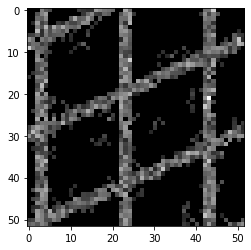

In [14]:
imshow(img_clear, cmap='gray')

In [15]:
final_image = img_clear

### 3D

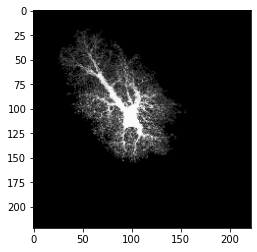

In [21]:
plt.imshow(img_clear.max(0), cmap='gray')

In [22]:
final_image = img_clear
# final_image = img_clear.max(0)

## CLAHE

In [16]:
import cv2

clahe = cv2.createCLAHE(clipLimit =2.0, tileGridSize=(8,8))

### 2D

In [35]:
final_image = clahe.apply(img_clear.astype('uint8'))

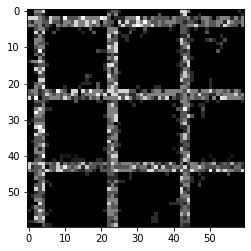

In [36]:
imshow(final_image, cmap='gray')

### 3D

In [17]:
img_clear = stack[:]

In [18]:
IMG_SHAPE = img_clear.shape

In [19]:
img_clear_flat = img_clear.reshape((IMG_SHAPE[0], -1))

In [20]:
final_image_flat = clahe.apply(img_clear_flat.astype('uint8'))

In [21]:
img_clear.max()

253

In [22]:
final_image = final_image_flat.reshape(IMG_SHAPE).astype(float)

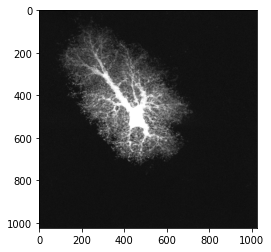

In [23]:
plt.imshow(final_image.max(0), cmap='gray')

Плохо, потому что работает только с целочисленными значениями.

# Soma segmentation

## Erosion

In [23]:
from skimage.morphology import erosion, dilation

In [24]:
w = napari.view_image(final_image)

In [25]:
to_erose = final_image[:]

In [22]:
for i in range(5):
    to_erose = erosion(to_erose)
eroded = remove_small_objects(to_erose > 0, 5, connectivity=3)
soma_mask = np.where(dilation(eroded), True, False)

In [23]:
w = napari.view_image(final_image)
w.add_image(soma_mask, blending='additive', colormap='cyan')

<Image layer 'Image' at 0x7fa6f81f9030>

In [14]:
def soma_extraction(image):
    for i in range(5):
        image = erosion(image)
    eroded = remove_small_objects(image > 0, 5, connectivity=3)
    return np.where(dilation(eroded), True, False)

In [15]:
data_path = '/home/levtg/astro-morpho/data/'

In [16]:
names = !ls $data_path/*.pic
names = [name for name in names if not 'hm' in name or not 'red' in name]

In [26]:
len(names)/5

15.0

In [1]:
plt.im


NameError: name 'plt' is not defined

In [42]:
w = napari.view_image(np.array([[0]]))
for imagename in tqdm(names[::10]):
    stack = read_image(imagename)
    image = filter_image(stack, threshold_li)
    eimage = np.where(image>0, np.exp(image), 0)
    w.add_image(image, colormap='magenta', name=os.path.basename(imagename))
    soma = soma_extraction(eimage)
#     soma = filter_image(e_image, lambda x: np.max(x)*0.8)
    w.add_image(soma, blending='additive', colormap='cyan', name=os.path.basename(imagename) + '_soma')

  0%|          | 0/8 [00:00<?, ?it/s]

# Tree segmentation

## Вектора Гессе - 2d

In [50]:
alpha = np.where(final_image > 0, 1, 0)
# alpha = 1

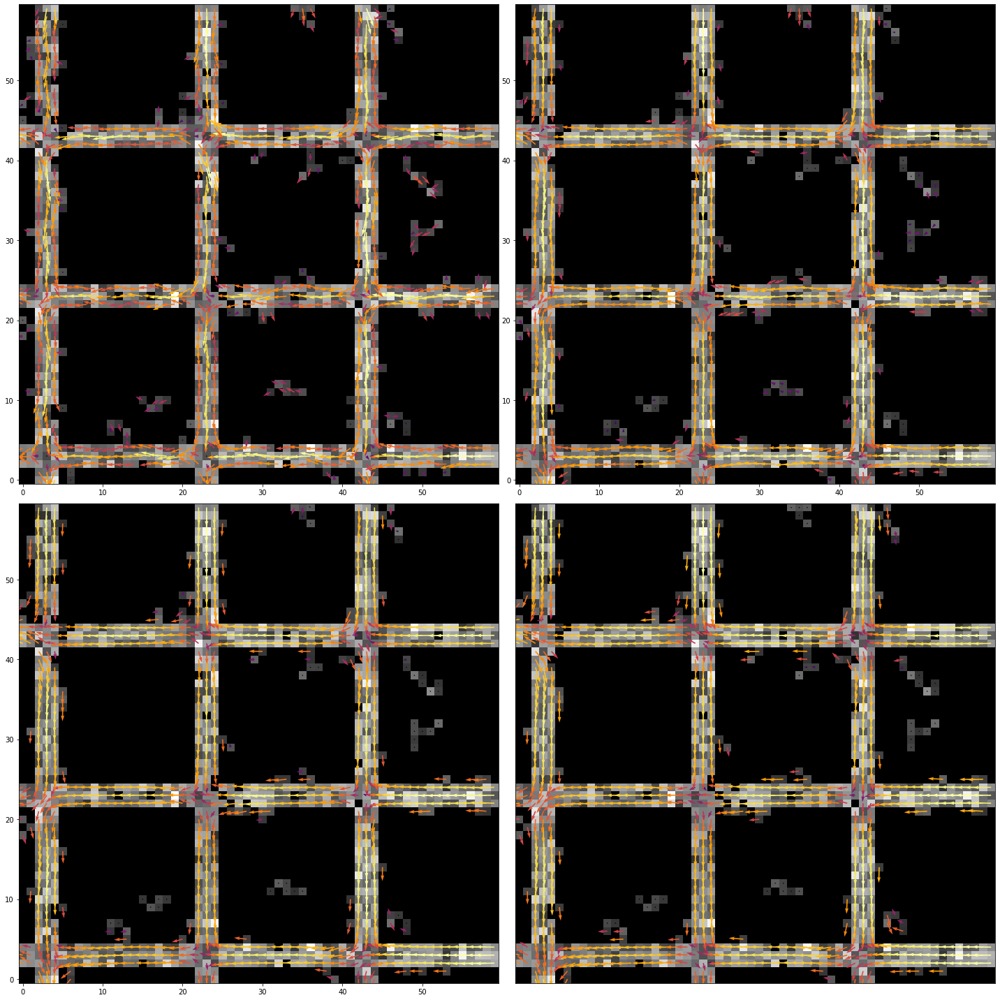

In [51]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

sigma = 1
sato, Vf = astro.hessian.sato2d(final_image, sigma, hessian_variant='gradient_of_smoothed', return_vectors=True)

ax = axes[0][0]
ax.imshow(final_image, cmap='gray', origin='lower')

weights = astro.enh.percentile_rescale(sato)**0.5 * alpha
i = 0
Vfx = Vf[...,i][...,::-1]
V = Vfx[...,0] # row directions (Y)
U = Vfx[...,1] # col directions (X)
h = ax.quiver(U*weights, V*weights, weights, scale=25, cmap='inferno')


sigma = 2
sato, Vf = astro.hessian.sato2d(final_image, sigma, hessian_variant='gradient_of_smoothed', return_vectors=True)

ax = axes[0][1]
ax.imshow(final_image, cmap='gray', origin='lower')

weights = astro.enh.percentile_rescale(sato)**0.5 * alpha
i = 0
Vfx = Vf[...,i][...,::-1]
V = Vfx[...,0] # row directions (Y)
U = Vfx[...,1] # col directions (X)
h = ax.quiver(U*weights, V*weights, weights, scale=25, cmap='inferno')


sigma = 3
sato, Vf = astro.hessian.sato2d(final_image, sigma, hessian_variant='gradient_of_smoothed', return_vectors=True)

ax = axes[1][0]
ax.imshow(final_image, cmap='gray', origin='lower')

weights = astro.enh.percentile_rescale(sato)**0.5 * alpha
i = 0
Vfx = Vf[...,i][...,::-1]
V = Vfx[...,0] # row directions (Y)
U = Vfx[...,1] # col directions (X)
h = ax.quiver(U*weights, V*weights, weights, scale=25, cmap='inferno')


sigma = 4
sato, Vf = astro.hessian.sato2d(final_image, sigma, hessian_variant='gradient_of_smoothed', return_vectors=True)

ax = axes[1][1]
ax.imshow(final_image, cmap='gray', origin='lower')

weights = astro.enh.percentile_rescale(sato)**0.5 * alpha
i = 0
Vfx = Vf[...,i][...,::-1]
V = Vfx[...,0] # row directions (Y)
U = Vfx[...,1] # col directions (X)
h = ax.quiver(U*weights, V*weights, weights, scale=25, cmap='inferno')

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.tight_layout()

## Graph creation

В качестве веса ребер будем брать косинусное расстояние между ними

x, y, vectors, weights, img_noisy

In [16]:
from tqdm.auto import tqdm

In [17]:
def weight_of(a, b):
    try:
        cos_dist = scipy.spatial.distance.cosine(a, b)
    except:
        cos_dist = 0
    return np.abs(1 - cos_dist) * np.mean([np.linalg.norm(a), np.linalg.norm(b)])

### 2d

In [111]:
sigma = 1

In [112]:
sato, Vf = astro.hessian.sato2d(final_image, sigma, hessian_variant='gradient_of_smoothed', return_vectors=True)

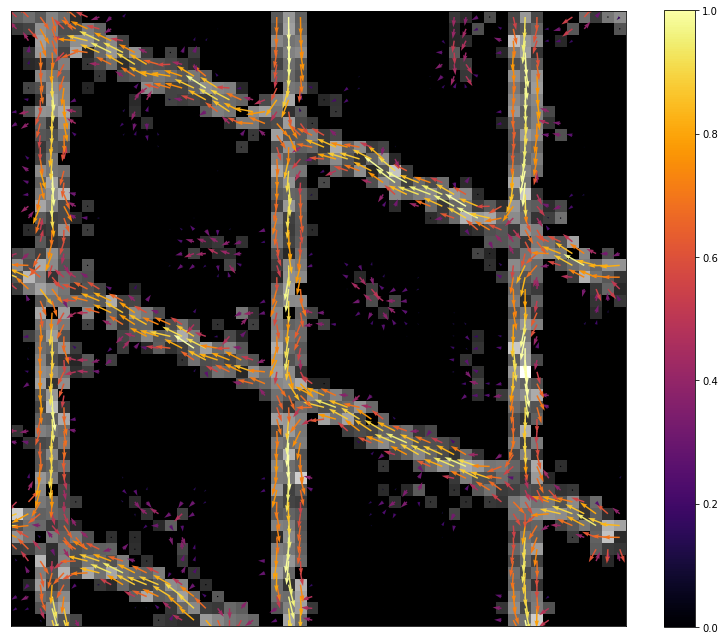

In [113]:
plt.figure(figsize=(11,9))
imshow(final_image, cmap='gray', origin='lower')

weights = astro.enh.percentile_rescale(sato)**0.5

i = 0
Vfx = Vf[...,i][...,::-1]

V = Vfx[...,0] # row directions (Y)
U = Vfx[...,1] # col directions (X)
plt.setp(plt.gca(), xticks=[], yticks=[])
h = quiver(U*weights, V*weights, weights, scale=25, cmap='inferno')
plt.colorbar(h, ax=plt.gca())
plt.tight_layout()

In [114]:
lengths = astro.enh.percentile_rescale(sato)**0.5

In [115]:
vectors = np.stack((U*lengths, V*lengths), axis=2)

In [116]:
nr, nc = (1, U.shape[0]) if U.ndim == 1 else U.shape
x, y = np.meshgrid(np.arange(nc), np.arange(nr))

In [117]:
k_h, k_w = 3, 3

In [118]:
G = nx.Graph()
nodes = {}

In [119]:
for row in tqdm(range(vectors.shape[0])):
    for col in range(vectors.shape[1]):
        cur = (row, col)
        cur_node = (x[cur], y[cur])
        nodes[cur_node] = cur_node
        G.add_node(cur_node, size=final_image[cur])
        for i in range(k_w):
            for j in range(k_h):
                pos = (np.clip(row + i - k_w//2, 0, U.shape[0] - 1), np.clip(col + j - k_h//2, 0, U.shape[1] - 1)) 
                pos_node = (x[pos], y[pos])
                if G.has_edge(cur_node, pos) or cur_node == pos_node:
                    continue
                weight = weight_of(vectors[cur], vectors[pos])
                if weight < 0.1:
                    continue
                nodes[pos_node] = pos_node
                G.add_edge(cur_node, pos_node, weight=1 - weight)
                

  0%|          | 0/52 [00:00<?, ?it/s]

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/scipy/spatial/distance.py:630: RuntimeWarning: invalid value encountered in double_scalars
  dist = 1.0 - uv / np.sqrt(uu * vv)


Считаем, что точки находятся на одной линии если угол между ними не превышает 45 градусов, т.е. значение весов >= 0.7

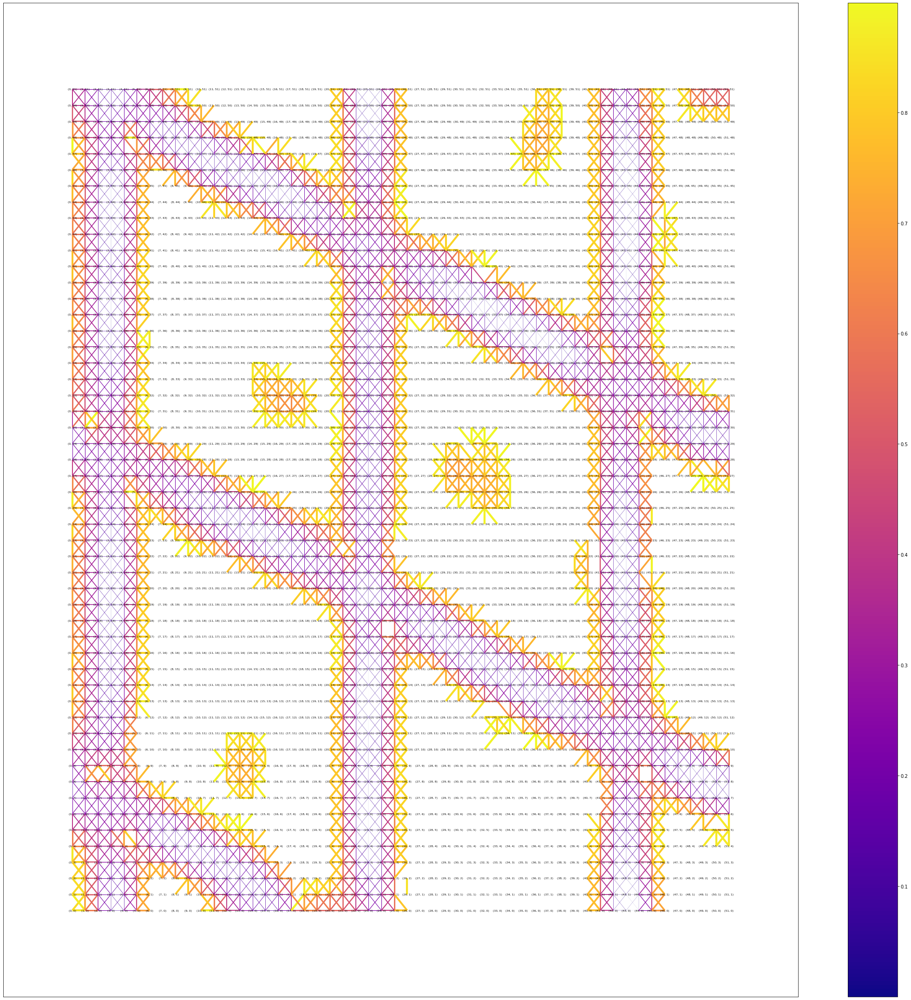

In [29]:
# %matplotlib notebook
plt.figure(figsize=(30, 30))
width = np.array([edgedata["weight"] for _, _, edgedata in G.edges(data=True)])
# width = np.where(width < 0.3, np.zeros(width.shape), width)
edges = nx.draw_networkx_edges(G, nodes, width=width*5, edge_cmap = plt.cm.plasma, edge_color=width)
labels = nx.draw_networkx_labels(G, nodes, font_size=6)

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.colorbar(edges, ax=plt.gca())
plt.tight_layout()
# imshow(clean_img, cmap='gray', origin='lower')

Построение пути

In [120]:
paths = nx.all_shortest_paths(G, (3, 50), (23, 20), weight='weight')

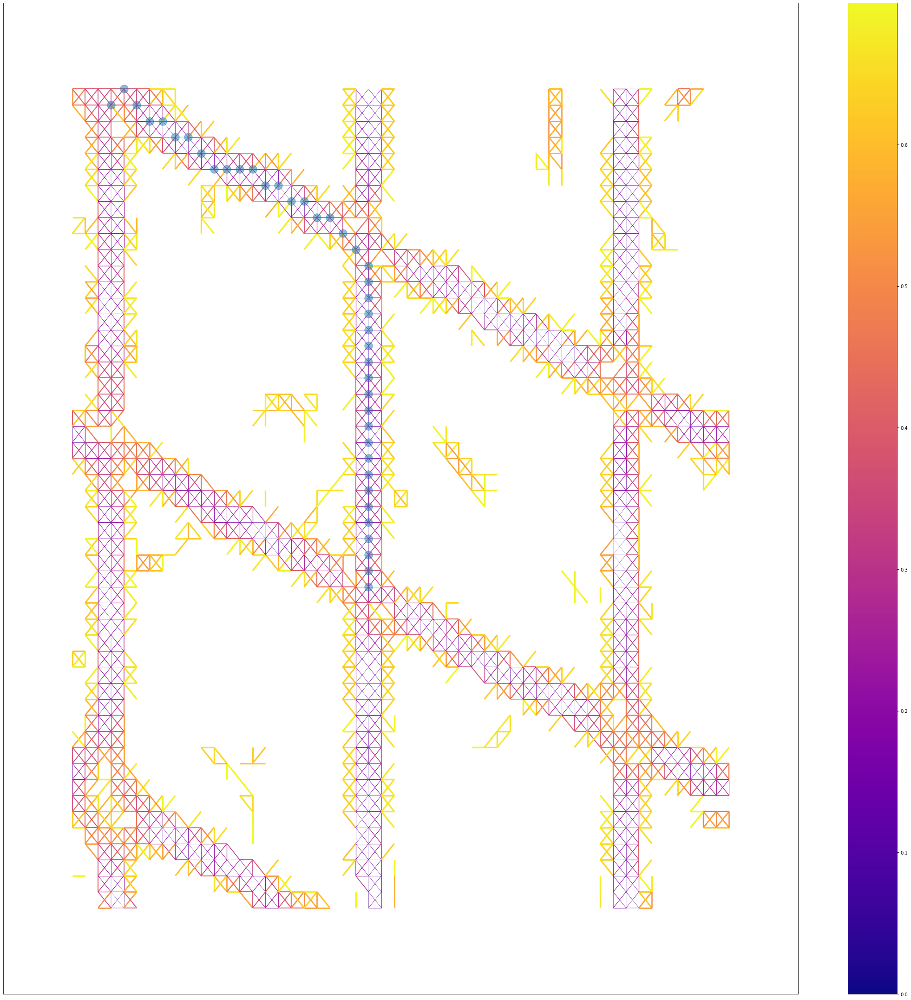

In [121]:
plt.figure(figsize=(30, 30))
width = np.array([edgedata["weight"] for _, _, edgedata in G.edges(data=True)])
width = np.where(width > 0.7, np.zeros(width.shape), width)
edges = nx.draw_networkx_edges(G, nodes, width=width*5, edge_cmap = plt.cm.plasma, edge_color=width)
for path in paths:
    path_edges = nx.draw_networkx_nodes(G, nodes, nodelist=path, alpha=0.5)

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.colorbar(edges, ax=plt.gca())
plt.tight_layout()
# imshow(clean_img, cmap='gray', origin='lower')

### 3d 

In [26]:
w = napari.view_image(final_image)

In [27]:
sigma = 2

In [28]:
sato, Vf = astro.hessian.sato3d(final_image, sigma, hessian_variant='gradient_of_smoothed', return_vectors=True)

In [29]:
Vfx = Vf[...,0][...,::-1]
V = Vfx[..., 0]
U = Vfx[..., 1]
C = Vfx[..., 2]

In [30]:
lengths = astro.enh.percentile_rescale(sato)**0.5

In [31]:
vectors = np.stack((U*lengths, V*lengths, C*lengths), axis=3)

In [32]:
vectors.shape

(77, 222, 222, 3)

In [33]:
import hessian_vectors as hv

In [34]:
hv.add_hessian_vectors(w, *hv.sato2napari_vectors(sato, Vf))

In [35]:
nr, nc, nz = (1, U.shape[0]) if U.ndim == 1 else U.shape
x, y, z = np.meshgrid(np.arange(nc), np.arange(nr), np.arange(nz))

In [36]:
k_h, k_w, k_s = 3, 3, 3

In [37]:
G = nx.Graph()
nodes = {}

In [38]:
def create_graph(image, vectors):
    G = nx.Graph()
    nodes = {}
    shape = vectors.shape
    for row in tqdm(range(shape[0])):
        for col in tqdm(range(shape[1])):
            for stk in tqdm(range(shape[2])):
                cur = (row, col, stk)
                cur_node = (x[cur], y[cur], z[cur])
                nodes[cur_node] = cur_node
                G.add_node(cur_node, size=image[cur])
                for i in range(k_w):
                    for j in range(k_h):
                        for k in range(k_s):
                            pos = (np.clip(row + i - k_w//2, 0, shape[0] - 1), 
                                   np.clip(col + j - k_h//2, 0, shape[1] - 1),
                                   np.clip(stk + k - k_s//2, 0, shape[2] - 1)) 
                            pos_node = (x[pos], y[pos], z[pos])
                            if G.has_edge(cur_node, pos) or cur_node == pos_node:
                                continue
                            weight = weight_of(vectors[cur], vectors[pos])
                            if weight < 10e-3:
                                continue
                            nodes[pos_node] = pos_node
                            G.add_edge(cur_node, pos_node, weight=1 - weight)
    return G, nodes
  

Считается ооооочень долго ~2.4 часа

In [146]:
# G, nodes = create_graph(final_image, vectors)

## ОПТИМИЗАЦИЯ

Вместо того, чтобы отдельно обходить каждый пиксель будем смещать весь массив и считать веса через взаимодействие двух массивов.
Всего получитя 18 массивов для объемных изображений и 8 для плоских.

### 2d

lu, uu, ru

ll,........ rr

ld, dd, rd

In [684]:
arr = vectors[:]

In [41]:
lu = np.roll(arr, 1, axis=(0, 1))
lu[0] = 0
lu[:, 0] = 0
uu = np.roll(arr, 1, axis=0)
uu[0] = 0
ru = np.roll(arr, (1, -1), axis=(0, 1))
ru[0] = 0
ru[:, -1] = 0

ll = np.roll(arr, 1, axis=1)
ll[:, 0] = 0
rr = np.roll(arr, -1, axis=1)
rr[:, -1] = 0

ld = np.roll(arr, (-1, 1), axis=(0, 1))
ld[-1] = 0
ld[:, 0] = 0
dd = np.roll(arr, -1, axis=0)
dd[-1] = 0
rd = np.roll(arr, -1, axis=(0, 1))
rd[:, -1] = 0
rd[-1] = 0


In [42]:
lu.shape

(60, 60, 2)

Для рассчетов нам понадобится переделать функцию косинусного расстояния:
$1 - \frac{uv}{||u||_2||v||_2}$

Скалярное произведение двух масиивов с векторами

In [29]:
mults = np.einsum('...ij,...ij->...i', arr,uu)

In [30]:
mults.shape

(60, 60)

Нормы

In [31]:
norms = np.linalg.norm(arr, axis=-1)

In [32]:
norms

array([[0.41409494, 0.5068709 , 0.69781105, ..., 0.26243504, 0.28140954,
        0.29888595],
       [0.54814695, 0.51899934, 0.58097296, ..., 0.48100292, 0.50607379,
        0.53200565],
       [0.78227963, 0.70003142, 0.50289961, ..., 0.79868602, 0.82043944,
        0.83943674],
       ...,
       [0.35083245, 0.57164696, 0.88820599, ..., 0.3431283 , 0.33651289,
        0.33617311],
       [0.2046967 , 0.52994482, 0.86555969, ..., 0.30108171, 0.25694366,
        0.21239622],
       [0.16047345, 0.51441437, 0.85469746, ..., 0.25739178, 0.19497745,
        0.13126519]])

In [33]:
np.linalg.norm(arr[0][0])

0.4140949403614324

In [57]:
norms_uu = np.linalg.norm(uu, axis=-1)

In [58]:
cosines = 1 - mults / ((norms * norms_uu))

/tmp/ipykernel_43387/1264050722.py:1: RuntimeWarning: invalid value encountered in true_divide
  cosines = 1 - mults / ((norms * norms_uu))


In [59]:
arr[1][0]

array([-0.62422969,  0.22737678])

In [60]:
uu[1][0]

array([-0.42220404,  0.28152029])

In [61]:
cosines[1][0]

0.028370781885204366

In [62]:
scipy.spatial.distance.cosine(arr[1][0], uu[1][0])

0.028370781885204255

Yey!!

In [63]:
norms[1][0], norms_uu[1][0]

(0.6643514929189228, 0.5074543545524872)

In [64]:
np.mean([norms[1][0], norms_uu[1][0]])

0.585902923735705

In [65]:
np.mean([norms, norms_uu], axis=0)[1][0]

0.585902923735705

In [48]:
def weight_of_arr(a, b):
    dprod = np.einsum('...ij,...ij->...i', a, b)
    norm_a = np.linalg.norm(a, axis=-1)
    norm_b = np.linalg.norm(b, axis=-1)
    cos_dist = np.nan_to_num(dprod / ((norm_a * norm_b)), nan=0)
    cos_dist = 1 - cos_dist
    return np.abs(1 - cos_dist) * np.mean([norm_a, norm_b], axis=0)

Для определения весов вычитаем полученное значение из единицы тк нужные нам ребра должны быть меньше по весу

In [45]:
weights = 1 - weight_of_arr(lu, arr)

/tmp/ipykernel_5211/1847692117.py:5: RuntimeWarning: invalid value encountered in true_divide
  cos_dist = np.nan_to_num(dprod / ((norm_a * norm_b)), nan=0)


Индексы

In [687]:
i, j = np.indices(arr.shape[:-1])

In [688]:
idxs = np.stack((i,j), axis=2)

Слайсы для выделения нужных данных

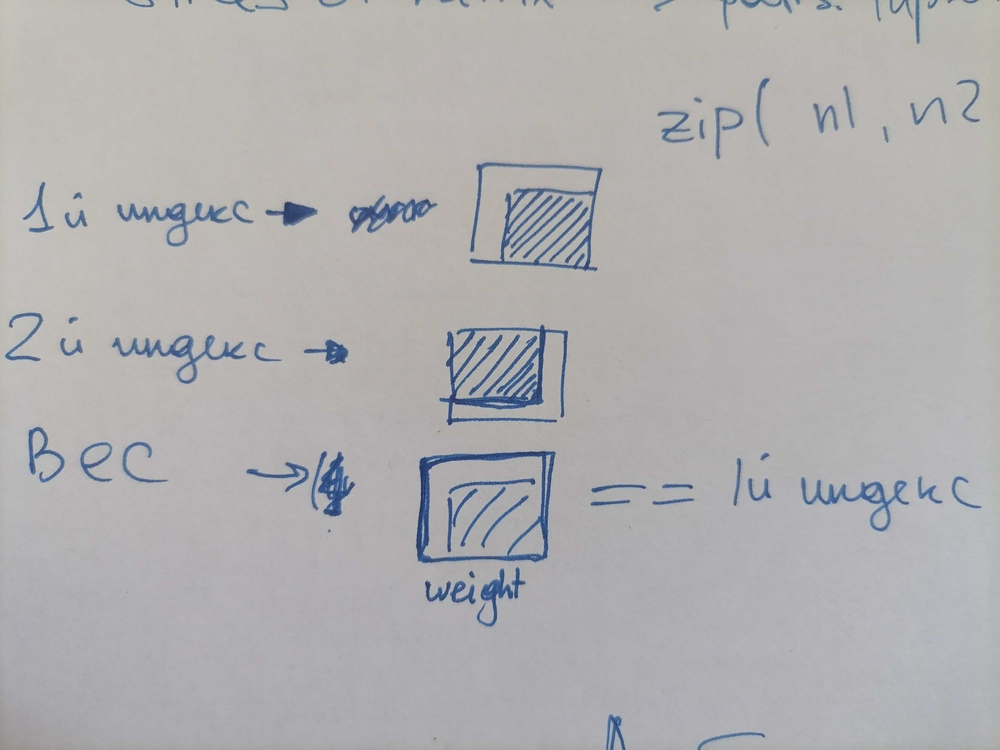

In [268]:
Image(filename='/home/levtg/astro-morpho/data/pictures_nb/IMG_20220408_170850.jpg') 

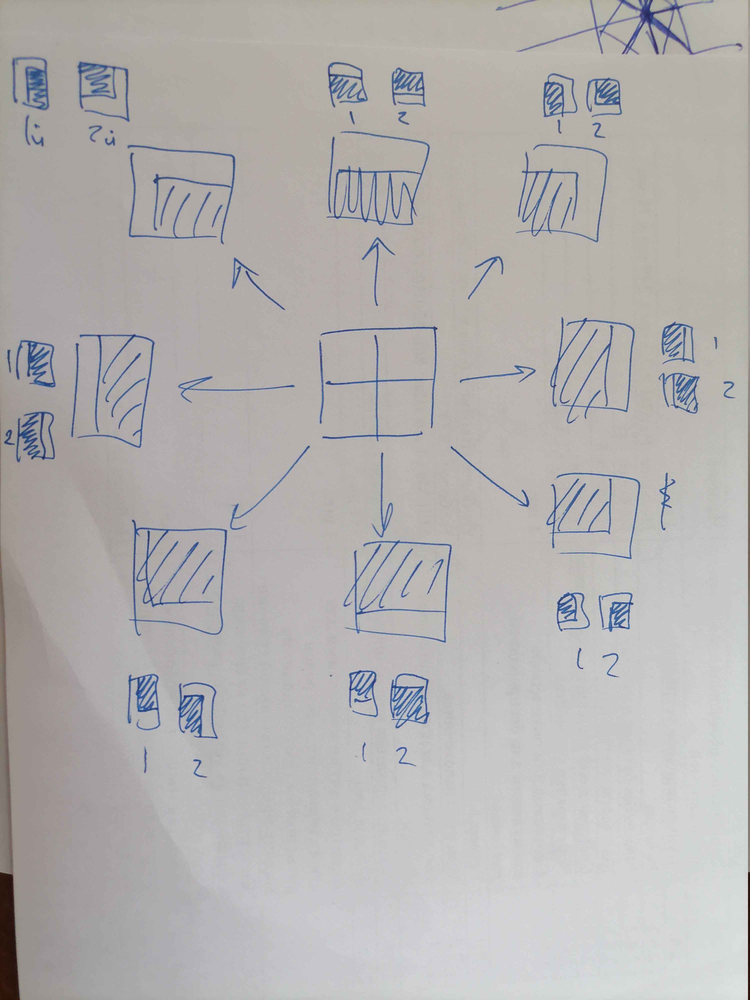

In [269]:
Image(filename='/home/levtg/astro-morpho/data/pictures_nb/IMG_20220408_170858.jpg') 

Всего 8 вариантов слайсов

In [689]:
lu_crop = (slice(1, None), slice(1, None))
rd_crop = (slice(None, -1), slice(None, -1))

uu_crop = (slice(1, None))
dd_crop = (slice(None, -1))

ru_crop = (slice(1, None), slice(None, -1))
ld_crop = (slice(None, -1), slice(1, None))

rr_crop = (slice(None), slice(None, -1))
ll_crop = (slice(None), slice(1, None))

In [690]:
shape = idxs.shape
shape

(60, 60, 2)

In [691]:
# idx_lu = [(i, j) for i, j in idxs[rd_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))]
# idx_rd = [(i, j) for i, j in idxs[lu_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))]

# idx_uu = [(i, j) for i, j in idxs[dd_crop].reshape(((shape[0]-1)*(shape[1]), 2))]
# idx_dd = [(i, j) for i, j in idxs[uu_crop].reshape(((shape[0]-1)*(shape[1]), 2))]

# idx_ru = [(i, j) for i, j in idxs[ld_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))]
# idx_ld = [(i, j) for i, j in idxs[ru_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))]

# idx_ll = [(i, j) for i, j in idxs[rr_crop].reshape(((shape[0]-1)*(shape[1]), 2))]
# idx_rr = [(i, j) for i, j in idxs[ll_crop].reshape(((shape[0]-1)*(shape[1]), 2))]

idx_lu = idxs[lu_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))
idx_rd = idxs[rd_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))

idx_uu = idxs[uu_crop].reshape(((shape[0]-1)*(shape[1]), 2))
idx_dd = idxs[dd_crop].reshape(((shape[0]-1)*(shape[1]), 2))

idx_ru = idxs[ru_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))
idx_ld = idxs[ld_crop].reshape(((shape[0]-1)*(shape[1]-1), 2))

idx_ll = idxs[ll_crop].reshape(((shape[0]-1)*(shape[1]), 2))
idx_rr = idxs[rr_crop].reshape(((shape[0]-1)*(shape[1]), 2))

Множество ребер определяют фон и не несут необходимой информации. Чтобы избавиться от них воспользуемся методом Ли

In [109]:
weights = weight_of_arr(arr[lu_crop], arr[rd_crop])
weight = weights[lu_crop]

/tmp/ipykernel_5211/1847692117.py:5: RuntimeWarning: invalid value encountered in true_divide
  cos_dist = np.nan_to_num(dprod / ((norm_a * norm_b)), nan=0)


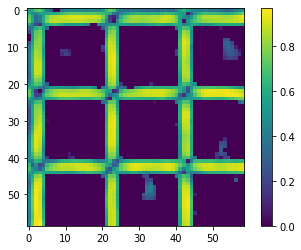

In [110]:
plt.imshow(weights)
plt.colorbar()

In [111]:
img = weights

li = threshold_li(img)
img_filt = np.where(img > li, img, 0)
binary_clean = remove_small_objects(img >= li, 5, connectivity=3)
weights_clear = np.where(binary_clean, img_filt, 0)

In [112]:
li

0.09117229180195303

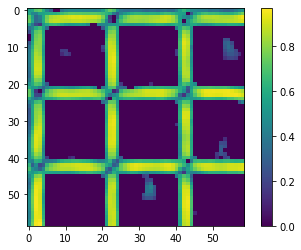

In [115]:
plt.imshow(weights_clear)
plt.colorbar()

Метод отлично выделил фон и сохранил необходимую информацию об изображении

Можно пользоваться только половиной массивов так как значения весов симметричны

In [692]:
Gh = nx.Graph()
nodes = {}

In [696]:
rd_crop = (slice(1, None), slice(1, None))
lu_crop = (slice(None, -1), slice(None, -1))

dd_crop = (slice(1, None))
uu_crop = (slice(None, -1))

ru_crop = (slice(1, None), slice(None, -1))
ld_crop = (slice(None, -1), slice(1, None))

ll_crop = (slice(None), slice(None, -1))
rr_crop = (slice(None), slice(1, None))

In [49]:
def calc_edges(arr1, arr2, index1, index2):
    weights = weight_of_arr(arr1, arr2)
    weight = weights.ravel()
    li = threshold_li(weight)
    idx1 = [tuple(i) for i in index1.reshape((-1, index1.shape[-1]))[weight>li]]
    idx2 = [tuple(i) for i in index2.reshape((-1, index2.shape[-1]))[weight>li]]
    return zip(idx1, idx2, 1 - weight[weight>li])

In [698]:
Gh = nx.Graph()
nodes2 = {}

In [699]:
%time Gh.add_weighted_edges_from(calc_edges(arr[lu_crop], arr[rd_crop], idxs[lu_crop], idxs[rd_crop]))
%time Gh.add_weighted_edges_from(calc_edges(arr[uu_crop], arr[dd_crop], idxs[uu_crop], idxs[dd_crop]))
%time Gh.add_weighted_edges_from(calc_edges(arr[ru_crop], arr[ld_crop], idxs[ru_crop], idxs[ld_crop]))
%time Gh.add_weighted_edges_from(calc_edges(arr[ll_crop], arr[rr_crop], idxs[ll_crop], idxs[rr_crop]))

CPU times: user 6.29 ms, sys: 1.12 ms, total: 7.4 ms
Wall time: 6.45 ms
CPU times: user 8.95 ms, sys: 0 ns, total: 8.95 ms
Wall time: 8.93 ms
CPU times: user 8.96 ms, sys: 133 µs, total: 9.1 ms
Wall time: 9.14 ms
CPU times: user 10.4 ms, sys: 19 µs, total: 10.4 ms
Wall time: 10.3 ms


/tmp/ipykernel_5211/1847692117.py:5: RuntimeWarning: invalid value encountered in true_divide
  cos_dist = np.nan_to_num(dprod / ((norm_a * norm_b)), nan=0)


In [700]:
nodes2 = {n:n for n in Gh.nodes()}

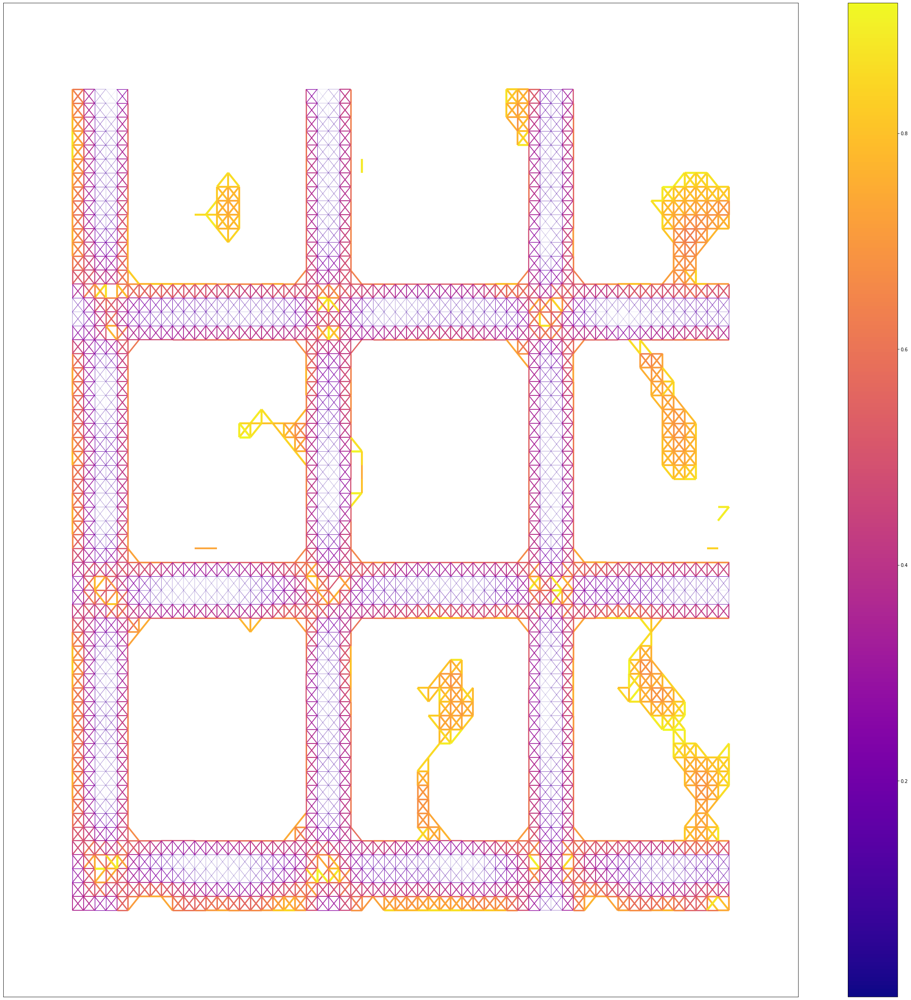

In [702]:
# Половина массива
plt.figure(figsize=(30, 30))
width = np.array([edgedata["weight"] for _, _, edgedata in Gh.edges(data=True)])
# width = np.where(width > 0.7, np.zeros(width.shape), width)
edges = nx.draw_networkx_edges(Gh, nodes2, width=width*5, edge_cmap = plt.cm.plasma, edge_color=width)
# labels = nx.draw_networkx_labels(G, nodes, font_size=6)

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.colorbar(edges, ax=plt.gca())
plt.tight_layout()

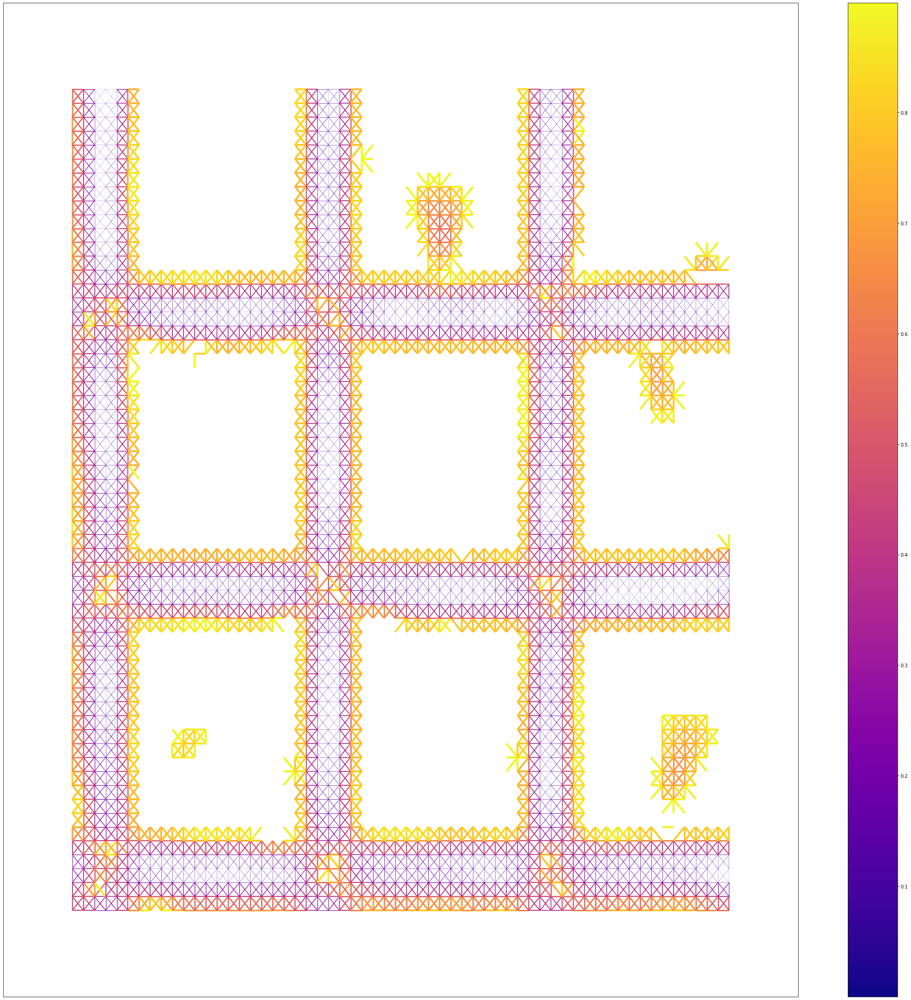

In [127]:
# Обход по картинке
plt.figure(figsize=(30, 30))
width = np.array([edgedata["weight"] for _, _, edgedata in G.edges(data=True)])
# width = np.where(width > 0.7, np.zeros(width.shape), width)
edges = nx.draw_networkx_edges(G, nodes, width=width*5, edge_cmap = plt.cm.plasma, edge_color=width)

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.colorbar(edges, ax=plt.gca())
plt.tight_layout()

### 3d

In [39]:
arr = vectors[:]

In [40]:
arr.shape

(77, 222, 222, 3)

В ходе расчетов было выяснено, что нам понадобятся: слайсы

Слайсы

In [41]:
iii_crop = (slice(1, None))

rdi_crop = (slice(1, None), slice(1, None), slice(1, None))
lui_crop = (slice(1, None), slice(None, -1), slice(None, -1))

ddi_crop = (slice(1, None), slice(1, None))
uui_crop = (slice(1, None), slice(None, -1))

rui_crop = (slice(1, None), slice(1, None), slice(None, -1))
ldi_crop = (slice(1, None), slice(None, -1), slice(1, None))

lli_crop = (slice(1, None), slice(None), slice(None, -1))
rri_crop = (slice(1, None), slice(None), slice(1, None))


rdd_crop = (slice(None), slice(1, None), slice(1, None))
luu_crop = (slice(None), slice(None, -1), slice(None, -1))

ddd_crop = (slice(None), slice(1, None))
uuu_crop = (slice(None), slice(None, -1))

ruu_crop = (slice(None), slice(1, None), slice(None, -1))
ldd_crop = (slice(None), slice(None, -1), slice(1, None))

lll_crop = (slice(None), slice(None), slice(None, -1))
rrr_crop = (slice(None), slice(None), slice(1, None))

rdo_crop = (slice(None, -1), slice(1, None), slice(1, None))
luo_crop = (slice(None, -1), slice(None, -1), slice(None, -1))

ddo_crop = (slice(None, -1), slice(1, None))
uuo_crop = (slice(None, -1), slice(None, -1))

ruo_crop = (slice(None, -1), slice(1, None), slice(None, -1))
ldo_crop = (slice(None, -1), slice(None, -1), slice(1, None))

llo_crop = (slice(None, -1), slice(None), slice(None, -1))
rro_crop = (slice(None, -1), slice(None), slice(1, None))

ooo_crop = (slice(None, -1))

In [42]:
# iii, ooo
# rdi, luo
# lui, rdo 
# ddi, uuo 
# uui, ddo 
# rui, ldo 
# ldi, ruo 
# lli, rro 
# rri, llo 
# rdd, luu 
# ddd, uuu 
# ruu, ldd 
# lll, rrr 

crops = [((slice(1, None)), (slice(None, -1))),
         ((slice(1, None), slice(1, None), slice(1, None)), (slice(None, -1), slice(None, -1), slice(None, -1))),
         ((slice(1, None), slice(None, -1), slice(None, -1)), (slice(None, -1), slice(1, None), slice(1, None))),
         ((slice(1, None), slice(1, None)), (slice(None, -1), slice(None, -1))),
         ((slice(1, None), slice(None, -1)), (slice(None, -1), slice(1, None))),
         ((slice(1, None), slice(1, None), slice(None, -1)), (slice(None, -1), slice(None, -1), slice(1, None))),
         ((slice(1, None), slice(None, -1), slice(1, None)), (slice(None, -1), slice(1, None), slice(None, -1))),
         ((slice(1, None), slice(None), slice(None, -1)), (slice(None, -1), slice(None), slice(1, None))),
         ((slice(1, None), slice(None), slice(1, None)), (slice(None, -1), slice(None), slice(None, -1))),
         ((slice(None), slice(1, None), slice(1, None)), (slice(None), slice(None, -1), slice(None, -1))),
         ((slice(None), slice(1, None)), (slice(None), slice(None, -1))),
         ((slice(None), slice(1, None), slice(None, -1)), (slice(None), slice(None, -1), slice(1, None))),
         ((slice(None), slice(None), slice(None, -1)), (slice(None), slice(None), slice(1, None)))]

Индексы

In [43]:
i, j, k = np.indices(arr.shape[:-1])

In [44]:
idx = np.stack((i,j,k), axis=3)

In [52]:
def calc_edges(arr1, arr2, index1, index2):
    weights = weight_of_arr(arr1, arr2)
    weight = weights.ravel()
    li = threshold_li(weight)
#     li = 0.7
    idx1 = [tuple(i) for i in index1.reshape((-1, index1.shape[-1]))[weight>li]]
    idx2 = [tuple(i) for i in index2.reshape((-1, index2.shape[-1]))[weight>li]]
    return zip(idx1, idx2, 1 - weight[weight>li])

Расчет весов и создание графа

In [46]:
G3 = nx.Graph()
nodes3 = {}

In [53]:
for crop, acrop in tqdm(crops):
    G3.add_weighted_edges_from(calc_edges(arr[crop], arr[acrop], idx[crop], idx[acrop]))

  0%|          | 0/13 [00:00<?, ?it/s]

/tmp/ipykernel_10845/1847692117.py:5: RuntimeWarning: invalid value encountered in true_divide
  cos_dist = np.nan_to_num(dprod / ((norm_a * norm_b)), nan=0)


In [54]:
nodes3 = {n:n for n in G3.nodes()}

In [304]:
len(nodes3) # li=0.027

69894

In [43]:
len(nodes3) # li=0.7

12824

In [305]:
nx.write_weighted_edgelist(G3, '{}_sigma{}_graph_edgelist'.format(os.path.basename(filename), sigma))

In [55]:
def draw_nodes(pos, nodelist):
    return np.asarray([pos[n] for n in nodelist])

In [115]:
%time path = nx.shortest_path(G3, (39, 126, 96), (39, 136, 167), weight='weight')

CPU times: user 96.3 ms, sys: 1.93 ms, total: 98.3 ms
Wall time: 97.3 ms


In [185]:
xyz = draw_nodes(nodes3, list(nodes3.keys()))
w.add_points(xyz, edge_color='none', size=0.5, face_color='y')

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())
/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/napari/layers/utils/color_transformations.py:42: UserWarning: The provided colors parameter contained illegal values, resetting all colors values to white.
  warnings.warn(


<Points layer 'xyz' at 0x7fa669ef9330>

In [186]:
xyz = draw_nodes(nodes3, path)

KeyError: (29, 109, 101)

In [117]:
w.add_shapes(xyz, shape_type='path', edge_color='r', edge_width=0.1)

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


<Shapes layer 'xyz [2]' at 0x7fa8733860e0>

# Скелетонизация

In [122]:
#2d
G3 = G
nodes3 = {n:n for n in G3.nodes()}
w = napari.view_image(final_image)

In [123]:
len(G3.nodes())/36000*0.1*60

0.4506666666666667

In [124]:
nodes = G3.nodes()

In [125]:
node_coords = np.array(list(nodes.keys()))

In [126]:
# center = (39, 126, 96)
# center = (29, 109, 101)
# center = (22, 123, 122)
# center = (50, 108, 98)
#2d
center = (23, 20)

In [127]:
#connected_to_center = [n for n in tqdm(node_coords) if nx.has_path(G3, center, tuple(n))]

In [128]:
import random as rd

In [129]:
node_dists = np.linalg.norm(center-node_coords, axis=-1)

In [311]:
cutoff = np.percentile(node_dists, 90)
cutoff

80.18104514160439

In [312]:
selected_nodes = node_coords[node_dists > cutoff]

In [313]:
selected_nodes.shape

(6989, 3)

In [323]:
# paths = []
# failed = []
# for node in tqdm(nodes):
#     try:
#         path = nx.shortest_path(G3, tuple(center), tuple(node), weight='weight')
#         paths.append(path)
#     except Exception as exc:
#         failed.append(exc)

  0%|          | 0/69894 [00:00<?, ?it/s]

In [130]:
paths_dict = nx.single_source_dijkstra_path(G3, center)
paths = list(paths_dict.values())

In [324]:
np.save('{}_sigma{}_paths_all'.format(os.path.basename(filename), sigma), np.array(paths, dtype=object))

In [248]:
# paths = []
# with open('3wk-both1-grn-raw.pic_sigma1_paths_all.txt') as fd:
#     for line in fd.readlines():
#         path = []
#         for point in line.split(';'):
#             p = tuple(map(int, point.split(',')))
#             path.append(p)
#         paths.append(path)

In [131]:
def count_points_paths(paths):
    acc = {}
    for path in paths:
        for n in path:
            if n in acc.keys():
                acc[n] += 1
            else:
                acc[n] = 1
    return acc
            

In [132]:
points = count_points_paths(paths)

In [133]:
count_1 = []
for path in paths:
    count = 0
    for n in path:
        if points[n] == 1:
            count += 1
    count_1.append(count)

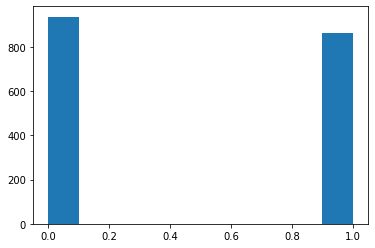

In [134]:
plt.hist(count_1)
plt.show()

In [135]:
w.add_points(draw_nodes(nodes3, points), size=1, edge_color='transparent', face_color='b', name='count')

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


<Points layer 'count' at 0x7f9fbf0a8490>

Большая часть точек который встречаются один раз - это концевые точки. От них можно избавиться чтобы не засорять данные

In [136]:
to_del = []
for point, count in points.items():
    if count == 1:
        to_del.append(point)

In [137]:
from copy import copy
points_count = copy(points)

In [138]:
for point in to_del:
    del points_count[point]

In [139]:
w.add_points(draw_nodes(nodes3, points_count), size=1, edge_color='transparent', face_color='r', name='count')

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


<Points layer 'count [1]' at 0x7f9fec2ce320>

In [140]:
len(points), len(points_count)

(1800, 938)

In [141]:
p = np.asarray(list(points_count.keys()))

In [142]:
vals = np.asarray(list(points_count.values()))

In [143]:
qstack = np.zeros(vectors.shape[:-1])
for loc, val in points_count.items():
    qstack[loc] = np.log(val)

In [144]:
w.add_image(qstack)

<Image layer 'qstack' at 0x7f9ff63075e0>

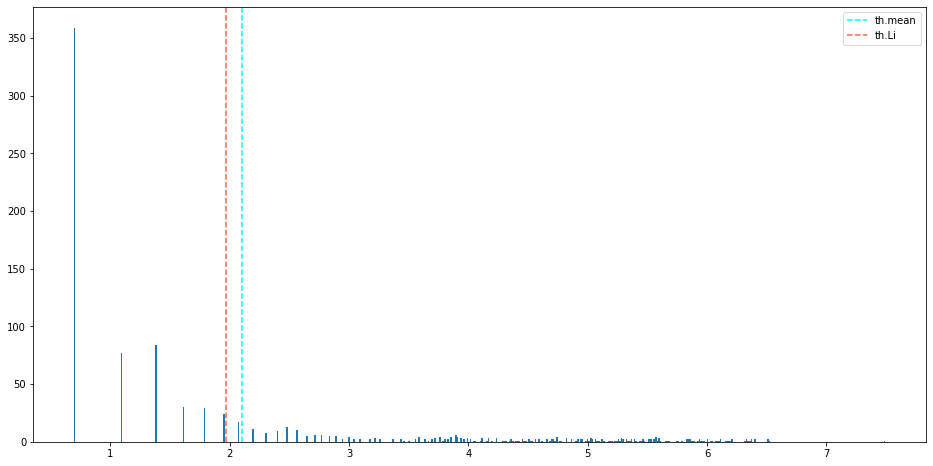

In [145]:
plt.figure(figsize=(16,8))
plt.hist(np.log(vals[vals>1]), bins=500)
#plt.xlim(-10, 100)
plt.axvline(np.mean(np.log(vals)), color='cyan', ls='--', label='th.mean')
plt.axvline(threshold_li(np.log(vals)), color='tomato', ls='--', label='th.Li')
plt.legend()
plt.show()

In [339]:
np.percentile(vals, (5, 25, 50, 75, 95))

array([  2.,   2.,   4.,  11., 225.])

In [148]:
li_vals = threshold_li(vals)

In [149]:
points_filt = [k for k, v in points_count.items() if v > np.mean(vals)]

In [150]:
w.add_points(draw_nodes(nodes3, points_filt), size=1, edge_color='transparent', face_color='m', name='filt mean')

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


<Points layer 'filt mean' at 0x7f9ff63cf760>

In [151]:
len(points), len(points_count), len(points_filt)

(1800, 938, 184)

In [73]:
np.mean(vals)

257.6767259198016

In [74]:
threshold_li(vals)

855.1577473205233

## Path merging by tree construction

In [146]:
import anytree as at

In [162]:
tree = G3.subgraph(points_count)
leaves = {n:n for n in G3.nodes()}

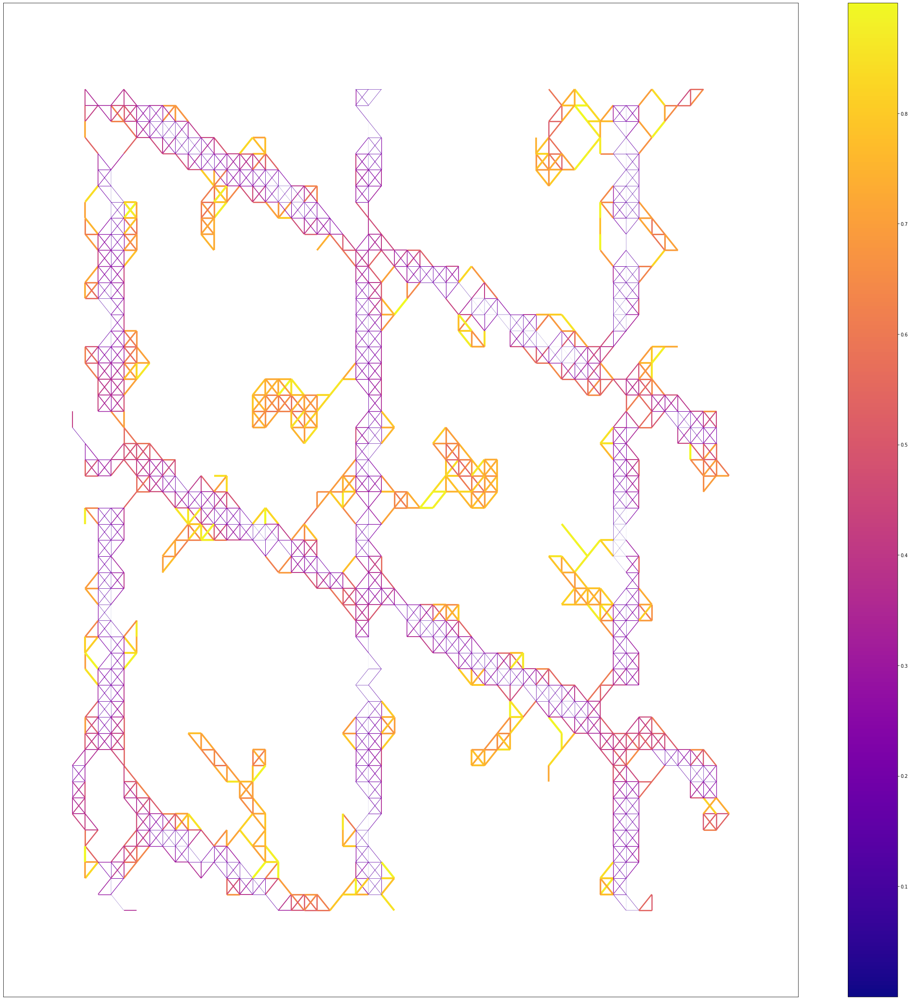

In [163]:
plt.figure(figsize=(30, 30))
width = np.array([edgedata["weight"] for _, _, edgedata in tree.edges(data=True)])
# width = np.where(width > 0.7, np.zeros(width.shape), width)
edges = nx.draw_networkx_edges(tree, leaves, width=width*5, edge_cmap = plt.cm.plasma, edge_color=width)
# labels = nx.draw_networkx_labels(G, nodes, font_size=6)

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.colorbar(edges, ax=plt.gca())
plt.tight_layout()

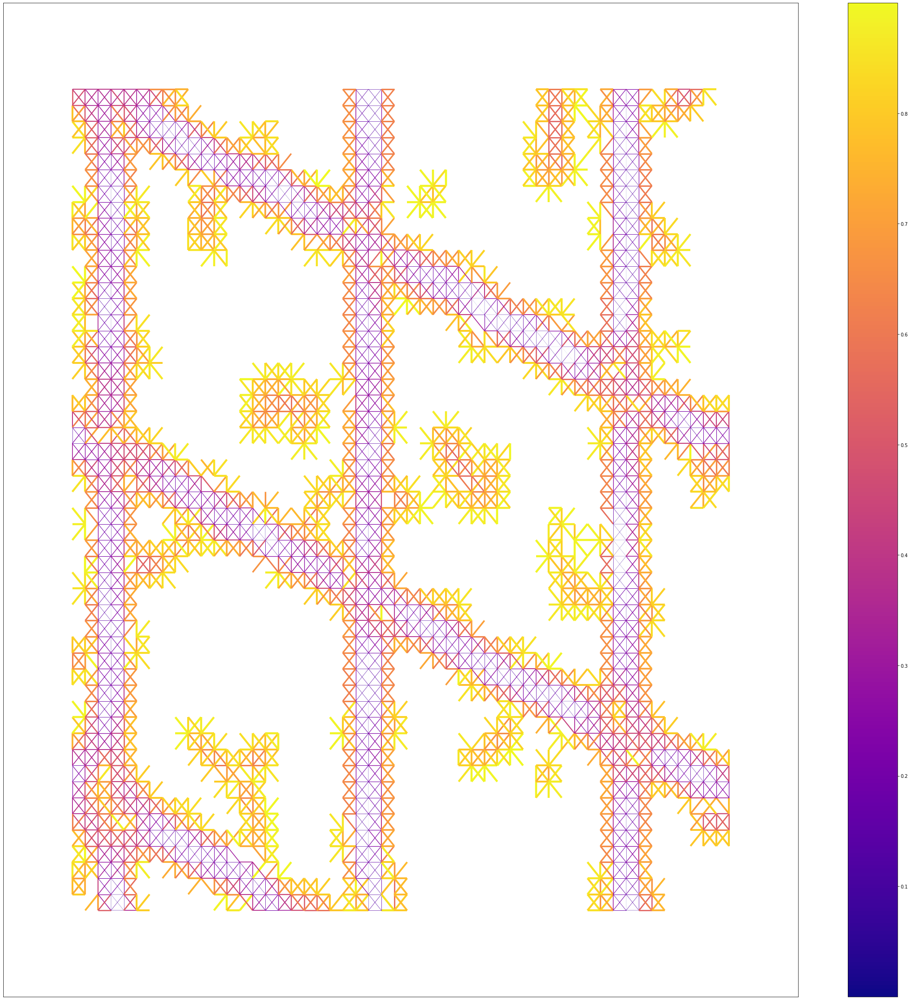

In [161]:
plt.figure(figsize=(30, 30))
width = np.array([edgedata["weight"] for _, _, edgedata in G3.edges(data=True)])
# width = np.where(width > 0.7, np.zeros(width.shape), width)
edges = nx.draw_networkx_edges(G3, nodes3, width=width*5, edge_cmap = plt.cm.plasma, edge_color=width)
# labels = nx.draw_networkx_labels(G, nodes, font_size=6)

plt.setp(plt.gca(), xticks=[], yticks=[])
plt.colorbar(edges, ax=plt.gca())
plt.tight_layout()

In [169]:
def draw_edges(pos, edgelist):
    edges = np.asarray([[pos[n1], pos[n2]] for n1, n2 in edgelist])
    return edges

In [170]:
w.add_shapes(draw_edges(leaves, list(tree.edges())), shape_type='path', edge_color='red', edge_width=0.1)

/home/levtg/astro-morpho/venv/lib64/python3.10/site-packages/numpy/core/numeric.py:2446: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return bool(asarray(a1 == a2).all())


<Shapes layer 'Shapes' at 0x7f9fef18c5b0>

In [164]:
# nx.algorithms.threshold.find_threshold_graph(G)

# Classic Skeletonization

In [56]:
skel_img = filter_image(img_noisy, lambda x: 180)

In [57]:
v = napari.view_image(skel_img)

In [ ]:
from skimage.morphology import skeletonize
skeleton = skeletonize(skel_img/skel_img.max())

In [72]:
v.add_image(skeleton, blending='additive', colormap='cyan')

<Image layer 'skeleton [1]' at 0x7fca4e07d090>

In [63]:
v.add_image(final_image, colormap='magenta')

<Image layer 'final_image' at 0x7fca4c28ef20>

In [66]:
skeleton = skeletonize(final_image/final_image.max(), method='lee')
v.add_image(skeleton, blending='additive', colormap='cyan')

<Image layer 'skeleton [2]' at 0x7fca4c2a6110>

ValueError: Buffer has wrong number of dimensions (expected 2, got 3)